In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly as ly
import seaborn as sns

In [ ]:
#Leitura de "spotify_artists.csv" para um data frame e tratamento dos dados exclusivamente para análise exploratória
df_artists = pd.read_csv('spotify_artists.csv', index_col=0)

#Remoção de colunas com informações irrelevantes ou redundantes
df_artists.drop(columns=["type"], inplace=True)

#Renomeação de colunas para melhor entendimento e cruzameto de informação com os demais .csv
df_artists.rename(columns={"name": "Nome do artista", 
                          "id": "ID do artista",
                          "artist_popularity": "Popularidade do artista",
                          "followers": "Seguidores",
                          "genres": "Gêneros",
                          "track_id": "ID da faixa",
                          "track_name_prev": "track_name_prev (artists)"}, inplace=True)

#Criação de coluna "Número de gêneros" e caracterização de artistas sem gêneros definidos como outliers, já que há perda de rótulo para a análise.
df_artists["Gêneros"] = df_artists["Gêneros"].apply(lambda x: x[1:-1].replace("\'", "").split(", "))
df_artists["Número de gêneros"] = df_artists["Gêneros"].apply(lambda x: len(x) if x != [""] else 0)

#Mudança na ordem das colunas para melhor visualização.
df_artists = df_artists[["Nome do artista",
                         "Popularidade do artista",
                         "Seguidores",
                         "Gêneros",
                         "Número de gêneros",
                         "track_name_prev (artists)",
                         "ID do artista",
                         "ID da faixa"]]

#Checagem de duplicatas a partir de características exclusivas aos artistas.
df_artists.drop_duplicates(["Nome do artista", "ID do artista"], inplace=True)
df_artists["Nome do artista"].value_counts()
df_artists["ID da faixa"].value_counts()

#Mudança de dtype para otimização
df_artists["ID do artista"] = df_artists["ID do artista"].astype("category")
df_artists["ID da faixa"] = df_artists["ID da faixa"].astype("category")


df_artists.info()
df_artists.head()

<class 'pandas.core.frame.DataFrame'>
Index: 56129 entries, 0 to 56128
Data columns (total 8 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   Nome do artista            56128 non-null  object  
 1   Popularidade do artista    56129 non-null  int64   
 2   Seguidores                 56129 non-null  int64   
 3   Gêneros                    56129 non-null  object  
 4   Número de gêneros          56129 non-null  int64   
 5   track_name_prev (artists)  56129 non-null  object  
 6   ID do artista              56129 non-null  category
 7   ID da faixa                56129 non-null  category
dtypes: category(2), int64(3), object(3)
memory usage: 7.2+ MB


,Nome do artista,Popularidade do artista,Seguidores,Gêneros,Número de gêneros,track_name_prev (artists),ID do artista,ID da faixa
0,Juliano Cezar,44,23230,"[sertanejo, sertanejo pop, sertanejo tradicion...",4,track_9,4mGnpjhqgx4RUdsIJiURdo,0wmDmAILuW9e2aRttkl4aC


In [ ]:
#Leitura de "spotify_albums.csv" para um data frame e tratamento dos dados exclusivamente para análise exploratória.
df_albums = pd.read_csv('spotify_albums.csv', index_col=0)

#Remoção de colunas com informações irrelevantes, redundantes ou que seriam interessantes apenas com web scrapping.
df_albums.drop(columns=["type", "images", "release_date_precision", "external_urls"], inplace=True)

#Renomeação de colunas para melhor entendimento e cruzameto de informação com os demais .csv.
df_albums.rename(columns={"album_type": "Tipo do álbum", 
                          "available_markets": "Mercados disponíveis (albums)", 
                          "name": "Nome do álbum", 
                          "release_date": "Data de lançamento", 
                          "total_tracks": "Número de faixas", 
                          "artist_id": "ID do artista",
                          "id": "ID do álbum",
                          "track_id": "ID da faixa",
                          "href": "href (albums)",
                          "uri": "uri (albums)",
                          "track_name_prev": "track_name_prev (albums)"}, inplace=True)

#Criação de coluna "Número de mercados disponíveis".
df_albums["Mercados disponíveis (albums)"] = df_albums["Mercados disponíveis (albums)"].apply(lambda x: x[1:-1].replace("\'", "").split(", "))
df_albums["Número de mercados disponíveis (albums)"] = df_albums["Mercados disponíveis (albums)"].apply(lambda x: len(x) if x != [""] else 0)


#Mudança na ordem das colunas para melhor visualização.
df_albums = df_albums[["Nome do álbum", 
                       "Tipo do álbum", 
                       "Data de lançamento", 
                       "Número de faixas", 
                       "Mercados disponíveis (albums)",
                       "Número de mercados disponíveis (albums)",
                       "href (albums)",
                       "uri (albums)",
                       "track_name_prev (albums)",
                       "ID do álbum",
                       "ID do artista",
                       "ID da faixa"]]

#Checagem de duplicatas a partir de características exclusivas aos álbuns.
df_albums.drop_duplicates(["ID do álbum", "Nome do álbum"], inplace=True)
df_albums["Nome do álbum"].value_counts()
df_albums["ID do artista"].value_counts()
df_albums["ID da faixa"].value_counts()
#No data frame de álbuns, há muitos álbuns com nomes genéricos, com destaque para "Spotify Singles", "Greatets Hits" e Spotify Sessions".
#Logo, a checagem de duplicatas será feita somente a partir do ID dos álbuns.
#Muitos álbuns e músicas são "Various Artists Songs", estando sob um mesmo ID de artista. Por outro lado, as músicas têm IDs únicos.

#Mudança de dtype para otimização
df_albums["ID do álbum"] = df_albums["ID do álbum"].astype("category")
df_albums["ID do artista"] = df_albums["ID do artista"].astype("category")
df_albums["ID da faixa"] = df_albums["ID da faixa"].astype("category")


df_albums.info()
df_albums.head()

<class 'pandas.core.frame.DataFrame'>
Index: 75511 entries, 0 to 75510
Data columns (total 12 columns):
 #   Column                                   Non-Null Count  Dtype   
---  ------                                   --------------  -----   
 0   Nome do álbum                            75511 non-null  object  
 1   Tipo do álbum                            75511 non-null  object  
 2   Data de lançamento                       75511 non-null  object  
 3   Número de faixas                         75511 non-null  int64   
 4   Mercados disponíveis (albums)            75511 non-null  object  
 5   Número de mercados disponíveis (albums)  75511 non-null  int64   
 6   href (albums)                            75511 non-null  object  
 7   uri (albums)                             75511 non-null  object  
 8   track_name_prev (albums)                 75511 non-null  object  
 9   ID do álbum                              75511 non-null  category
 10  ID do artista                          

,Nome do álbum,Tipo do álbum,Data de lançamento,Número de faixas,Mercados disponíveis (albums),Número de mercados disponíveis (albums),href (albums),uri (albums),track_name_prev (albums),ID do álbum,ID do artista,ID da faixa
0,If I Ain't Got You EP,single,2019-02-08,6,"[AD, AE, AR, AT, AU, BE, BG, BH, BO, BR, CA, C...",79,https://api.spotify.com/v1/albums/1gAM7M4rBwEb...,spotify:album:1gAM7M4rBwEbSPeAQR2nx1,track_32,1gAM7M4rBwEbSPeAQR2nx1,3DiDSECUqqY1AuBP8qtaIa,2iejTMy9XZ8Gaae0aQ2yl0


In [ ]:
#Leitura de "spotify_tracks.csv" para um data frame e tratamento dos dados exclusivamente para análise exploratória.
df_tracks = pd.read_csv('spotify_tracks.csv', index_col=0)

#Remoção de colunas com informações irrelevantes, redundantes ou que seriam interessantes apenas com web scrapping.
df_tracks.drop(columns=["type", "lyrics", "analysis_url", "preview_url"], inplace=True)

#Renomeação de colunas para melhor entendimento e cruzameto de informação com os demais .csv.
df_tracks.rename(columns={"name": "Nome da faixa",
                          "popularity": "Popularidade da faixa",
                          "country" : "País",
                          "duration_ms": "Duração da faixa (s)",
                          "available_markets": "Mercados disponíveis (tracks)",
                          "track_number": "Número da faixa",
                          "disc_number": "Número do disco",
                          "album_id": "ID do álbum",
                          "id": "ID da faixa (tracks)",
                          "artists_id": "ID do artista (tracks)",
                          "acousticness": "Acusticidade",
                          "danceability": "Dançabilidade",
                          "energy": "Energia",
                          "instrumentalness": "Instrumentalidade",
                          "key": "Tom",
                          "liveness": "Vivacidade",
                          "loudness": "Intensidade",
                          "mode": "Modo",
                          "speechiness": "Vocal",
                          "tempo": "Pulsação (BPM)",
                          "time_signature": "Ritmo",
                          "valence": "Comovência",
                          "playlist": "Playlist",
                          "track_name_prev": "track_name_prev (tracks)",
                          "uri": "uri (tracks)",
                          "href": "href (tracks)"}, inplace=True)

#Criação de coluna "Número de mercados disponíveis".
df_tracks["Mercados disponíveis (tracks)"] = df_tracks["Mercados disponíveis (tracks)"].apply(lambda x: x[1:-1].replace("\'", "").split(", "))
df_tracks["Número de mercados disponíveis (tracks)"] = df_tracks["Mercados disponíveis (tracks)"].apply(lambda x: len(x) if x != [""] else 0)

#Mudança na coluna de duração para melhor visualização dos dados
df_tracks["Duração da faixa (s)"] = df_tracks["Duração da faixa (s)"]/1000

#Mudança na ordem das colunas para melhor visualização.
df_tracks = df_tracks[["Nome da faixa",
                       "País",
                       "Playlist",
                       "Número do disco",
                       "Número da faixa",
                       "Popularidade da faixa",
                       "Mercados disponíveis (tracks)",
                       "Número de mercados disponíveis (tracks)",
                       "Duração da faixa (s)",
                       "Acusticidade",
                       "Dançabilidade",
                       "Energia",
                       "Instrumentalidade",
                       "Tom",
                       "Vivacidade",
                       "Intensidade",
                       "Modo",
                       "Vocal",
                       "Pulsação (BPM)",
                       "Ritmo",
                       "Comovência",
                       "href (tracks)",
                       "uri (tracks)",
                       "track_name_prev (tracks)",
                       "ID do álbum",
                       "ID do artista (tracks)",
                       "ID da faixa (tracks)"]]

#Checagem de duplicatas a partir de características exclusivas às faixas.
df_tracks.drop_duplicates(["ID da faixa (tracks)", "Nome da faixa"], inplace=True)
df_tracks["Nome da faixa"].value_counts()
df_tracks["ID do artista (tracks)"].value_counts()
df_tracks["ID do álbum"].value_counts()

#Mudança de dtype para otimização
df_tracks["ID do álbum"] = df_tracks["ID do álbum"].astype("category")
df_tracks["ID do artista (tracks)"] = df_tracks["ID do artista (tracks)"].astype("category")
df_tracks["ID da faixa (tracks)"] = df_tracks["ID da faixa (tracks)"].astype("category")


df_tracks.info()
df_tracks.head()

<class 'pandas.core.frame.DataFrame'>
Index: 101939 entries, 0 to 101938
Data columns (total 27 columns):
 #   Column                                   Non-Null Count   Dtype   
---  ------                                   --------------   -----   
 0   Nome da faixa                            101939 non-null  object  
 1   País                                     101939 non-null  object  
 2   Playlist                                 101939 non-null  object  
 3   Número do disco                          101939 non-null  float64 
 4   Número da faixa                          101939 non-null  float64 
 5   Popularidade da faixa                    101939 non-null  float64 
 6   Mercados disponíveis (tracks)            101939 non-null  object  
 7   Número de mercados disponíveis (tracks)  101939 non-null  int64   
 8   Duração da faixa (s)                     101939 non-null  float64 
 9   Acusticidade                             101939 non-null  float64 
 10  Dançabilidade            

,Nome da faixa,País,Playlist,Número do disco,Número da faixa,Popularidade da faixa,Mercados disponíveis (tracks),Número de mercados disponíveis (tracks),Duração da faixa (s),Acusticidade,...,Vocal,Pulsação (BPM),Ritmo,Comovência,href (tracks),uri (tracks),track_name_prev (tracks),ID do álbum,ID do artista (tracks),ID da faixa (tracks)
0,Blood,BE,Hipsteribrunssi,1.0,1.0,28.0,"[AD, AE, AR, AT, AU, BE, BG, BH, BO, BR, CA, C...",79,235.584,0.294,...,0.0262,115.018,4.0,0.622,https://api.spotify.com/v1/tracks/5qljLQuKnNJf...,spotify:track:5qljLQuKnNJf4F4vfxQB0V,track_14,0D3QufeCudpQANOR7luqdr,['3mxJuHRn2ZWD5OofvJtDZY'],5qljLQuKnNJf4F4vfxQB0V


In [23]:
#Merge dos data frames
df_artists.sort_values("ID do artista", inplace=True)
df_albums.sort_values("ID do artista", inplace=True)
df_artists_albums = pd.merge(df_artists, df_albums, on="ID do artista", how="inner")
df_melodiaanalytics = pd.merge(df_artists_albums, df_tracks, on="ID do álbum", how="inner")
df_melodiaanalytics

,Nome do artista,Popularidade do artista,Seguidores,Gêneros,Número de gêneros,track_name_prev (artists),ID do artista,ID da faixa_x,Nome do álbum,Tipo do álbum,...,Modo,Vocal,Pulsação (BPM),Ritmo,Comovência,href (tracks),uri (tracks),track_name_prev (tracks),ID do artista (tracks),ID da faixa (tracks)
0,Disco Ensemble,39,19783,"[finnish indie, suomi rock]",2,track_19,0027wHZDQXpRll4ckwDGad,6Ovi0f2Ant45moF9zJNERx,Second Soul,single,...,1.0,0.0346,127.981,4.0,0.201,https://api.spotify.com/v1/tracks/0NVymX3RQRwx...,spotify:track:0NVymX3RQRwxeKd80LNXhp,track_28,['0027wHZDQXpRll4ckwDGad'],0NVymX3RQRwxeKd80LNXhp
1,Disco Ensemble,39,19783,"[finnish indie, suomi rock]",2,track_19,0027wHZDQXpRll4ckwDGad,6Ovi0f2Ant45moF9zJNERx,Warriors,album,...,0.0,0.0508,140.015,4.0,0.315,https://api.spotify.com/v1/tracks/6Ovi0f2Ant45...,spotify:track:6Ovi0f2Ant45moF9zJNERx,track_22,['0027wHZDQXpRll4ckwDGad'],6Ovi0f2Ant45moF9zJNERx
2,Blaklez,25,3609,[south african hip hop],1,track_46,002eDhqXlxtQHdaIKXyf3H,3Ic2TBdG6l6AC2kTHnnsNj,I Have No One,single,...,1.0,0.4770,76.741,1.0,0.165,https://api.spotify.com/v1/tracks/3Ic2TBdG6l6A...,spotify:track:3Ic2TBdG6l6AC2kTHnnsNj,track_29,['002eDhqXlxtQHdaIKXyf3H'],3Ic2TBdG6l6AC2kTHnnsNj
3,Stella,42,6887,"[finnish dance pop, finnish pop, iskelma, suom...",4,track_16,002oyMRzxTzEsBRLzACi8d,2nWAYmsTPSpza7X5tY6ZrH,Pelkääjän paikalla,album,...,1.0,0.0299,79.637,4.0,0.264,https://api.spotify.com/v1/tracks/0e0FFeJLCNrq...,spotify:track:0e0FFeJLCNrqO1abELMG21,track_31,['002oyMRzxTzEsBRLzACi8d'],0e0FFeJLCNrqO1abELMG21
4,Stella,42,6887,"[finnish dance pop, finnish pop, iskelma, suom...",4,track_16,002oyMRzxTzEsBRLzACi8d,2nWAYmsTPSpza7X5tY6ZrH,Kuuntelija,album,...,0.0,0.0346,126.224,4.0,0.404,https://api.spotify.com/v1/tracks/4WqsrF7TJMNc...,spotify:track:4WqsrF7TJMNcXpALt6amw6,track_2,['002oyMRzxTzEsBRLzACi8d'],4WqsrF7TJMNcXpALt6amw6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101139,¡Oye Frank! Sonata Latina Tribute Orchestra,33,1975,[],0,track_13,7zug34wHklQjAqvDHAhqJ3,4nzt9tMnW4IJs2Xtv0BBbq,¡Oye Frank! Sonata Latina Tribute Orchestra,album,...,1.0,0.0258,95.004,4.0,0.505,https://api.spotify.com/v1/tracks/4nzt9tMnW4IJ...,spotify:track:4nzt9tMnW4IJs2Xtv0BBbq,track_13,['7zug34wHklQjAqvDHAhqJ3'],4nzt9tMnW4IJs2Xtv0BBbq
101140,LANZI,16,6,[arab trap],1,track_36,7zv5LZrRfP6BPMI55E7BtM,1BIloS8IudcXo5B2Dtlmy1,Dahaka,single,...,1.0,0.0457,149.899,4.0,0.177,https://api.spotify.com/v1/tracks/1BIloS8IudcX...,spotify:track:1BIloS8IudcXo5B2Dtlmy1,track_44,"['7zv5LZrRfP6BPMI55E7BtM', '5MxQZFj0dZlvwo2bIF...",1BIloS8IudcXo5B2Dtlmy1
101141,Fayza Ahmed,25,9158,"[classic arab pop, syrian pop]",2,track_29,7zwF847GE2hY5ApGSOLmBG,1O4lVF8Foazqwcrc0zFb4R,ست الحبايب,album,...,0.0,0.0455,89.980,4.0,0.461,https://api.spotify.com/v1/tracks/1O4lVF8Foazq...,spotify:track:1O4lVF8Foazqwcrc0zFb4R,track_39,['7zwF847GE2hY5ApGSOLmBG'],1O4lVF8Foazqwcrc0zFb4R
101142,Jonas Hain,31,174,[],0,track_19,7zxfdCSBICZykdOxXyH9dM,7uAYgR5I6TOzEi1vEAFxnj,Solopiano,album,...,0.0,0.0500,64.449,4.0,0.143,https://api.spotify.com/v1/tracks/7uAYgR5I6TOz...,spotify:track:7uAYgR5I6TOzEi1vEAFxnj,track_18,['7zxfdCSBICZykdOxXyH9dM'],7uAYgR5I6TOzEi1vEAFxnj


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101144 entries, 0 to 101143
Data columns (total 20 columns):
 #   Column                                   Non-Null Count   Dtype  
---  ------                                   --------------   -----  
 0   Popularidade do artista                  101144 non-null  int64  
 1   Seguidores                               101144 non-null  int64  
 2   Número de gêneros                        101144 non-null  int64  
 3   Número de faixas                         101144 non-null  int64  
 4   Número de mercados disponíveis (albums)  101144 non-null  int64  
 5   Popularidade da faixa                    101144 non-null  float64
 6   Número de mercados disponíveis (tracks)  101144 non-null  int64  
 7   Duração da faixa (s)                     101144 non-null  float64
 8   Acusticidade                             101144 non-null  float64
 9   Dançabilidade                            101144 non-null  float64
 10  Energia                         

<Axes: >

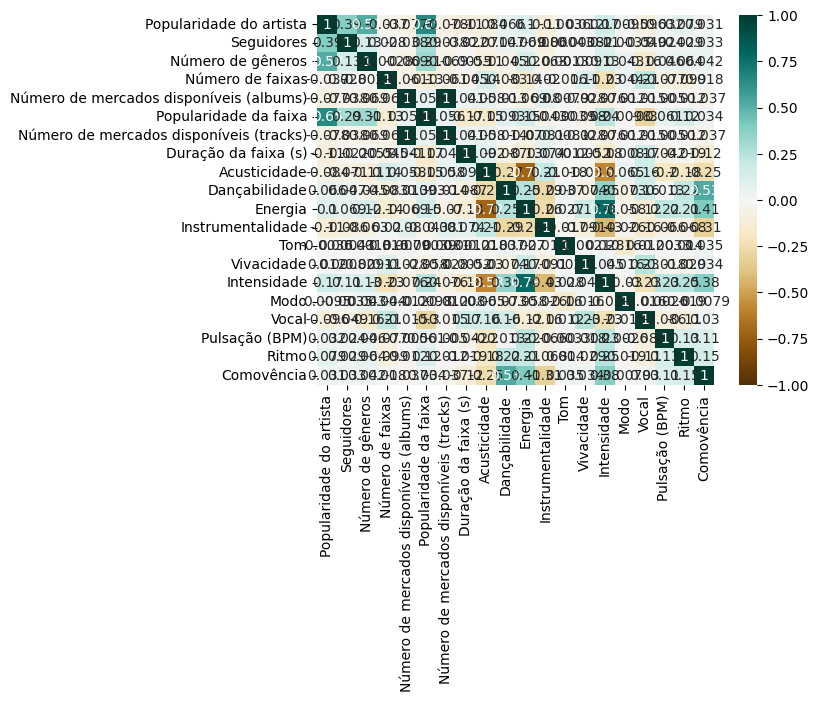

In [ ]:
#Criação de data frame numérico para correlações
df_numerico = df_melodiaanalytics.drop(['Nome do artista', 'Gêneros', 'track_name_prev (artists)', 'ID do artista', 'ID da faixa_x', 'Nome do álbum', 'Tipo do álbum', 'Mercados disponíveis (albums)', 'href (albums)', 'uri (albums)', 'track_name_prev (albums)', 'ID do álbum', 'ID da faixa_y', 'Nome da faixa', 'Playlist', 'Número do disco', 'Mercados disponíveis (tracks)', 'ID do artista (tracks)', 'ID da faixa (tracks)', 'uri (tracks)', 'track_name_prev (tracks)', 'href (tracks)', 'Data de lançamento', 'País', 'Número da faixa'], axis = 1)


#Criação do heatmap
sns.heatmap(df_numerico.corr(),
            annot=True,
            vmin = -1,  vmax = 1,
            cmap = 'BrBG')

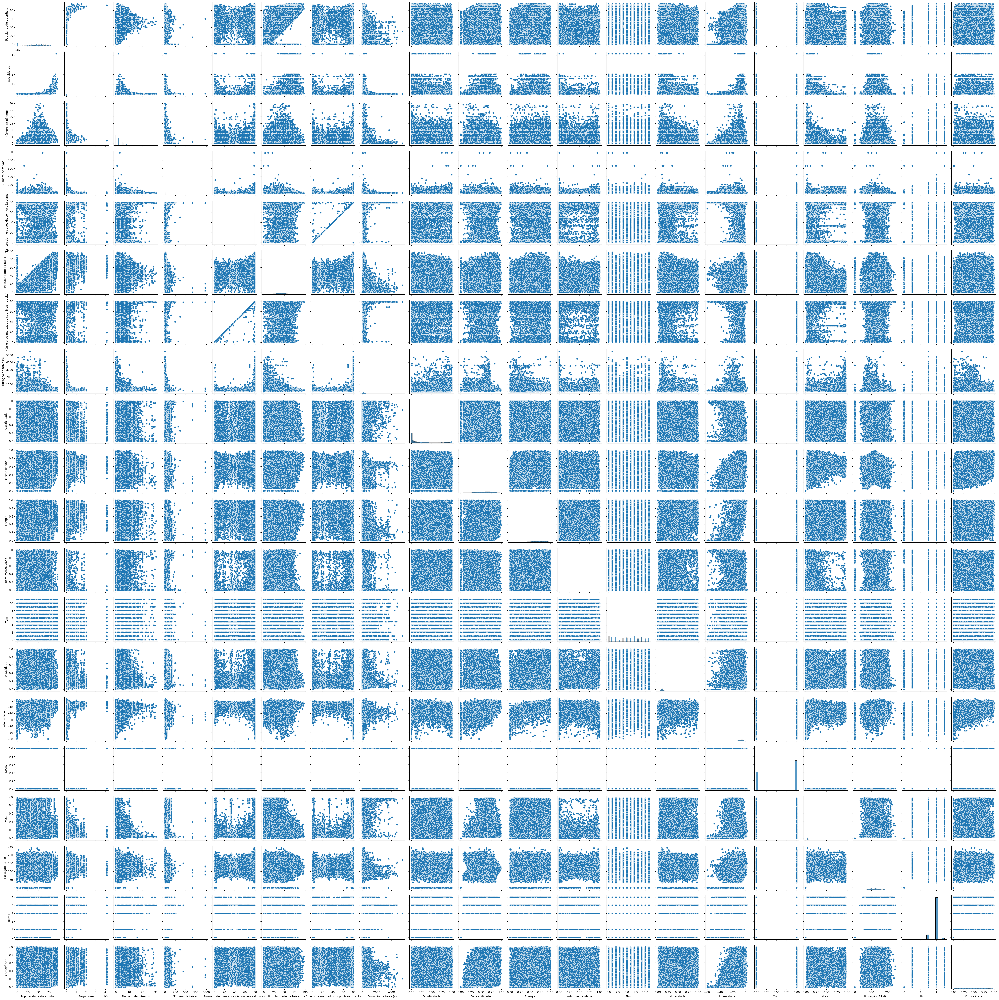

In [25]:
#Criação de pairplot
sns.pairplot(df_numerico)